In [ ]:
! pip install wfdb plotly


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys
import wfdb
import os
import random
import plotly.graph_objs as go
import plotly.subplots as sp

In [2]:
# Chemin vers la base de données
BASE_PATH = "C:/Users/user/ecg-database1.0.0"
def list_hea_files(base_path):
    hea_paths = []
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith(".hea"):
                hea_paths.append(os.path.join(root, file))
    return hea_paths

In [3]:

def load_signal_and_metadata(hea_path, lead="ii"):
    record_path = hea_path.replace(".hea", "")
    record = wfdb.rdrecord(record_path)
    available_leads = [s.lower() for s in record.sig_name]
    if lead.lower() not in available_leads:
        return None, None, None
    idx = available_leads.index(lead.lower())
    signal = record.p_signal[:, idx]
    fs = record.fs

    label = "Unknown"
    with open(hea_path, "r") as f:
        for line in f:
            if line.lower().startswith("# diagnose") or line.lower().startswith("# diagnose:"):
                parts = line.strip().split(":")
                if len(parts) > 1:
                    label = parts[1].strip().lower()
    return signal, fs, label


In [4]:
hea_files = list_hea_files(BASE_PATH)
sampled_files = random.sample(hea_files, 6)

signals = []
labels = []
for path in sampled_files:
    sig, fs, label = load_signal_and_metadata(path)
    if sig is not None:
        signals.append(sig)
        labels.append(label)


In [5]:
fig = sp.make_subplots(rows=3, cols=2, subplot_titles=labels)

for i, sig in enumerate(signals):
    time = np.arange(len(sig)) / fs
    trace = go.Scatter(x=time, y=sig, mode='lines', line=dict(color="black"), name=labels[i])
    row = i // 2 + 1
    col = i % 2 + 1
    fig.add_trace(trace, row=row, col=col)

fig.update_layout(height=800, width=1000, title_text="Visualisation de 6 signaux ECG (lead II)")
fig.update_xaxes(title_text="Temps (s)")
fig.update_yaxes(title_text="Amplitude (mV)")
fig.show()


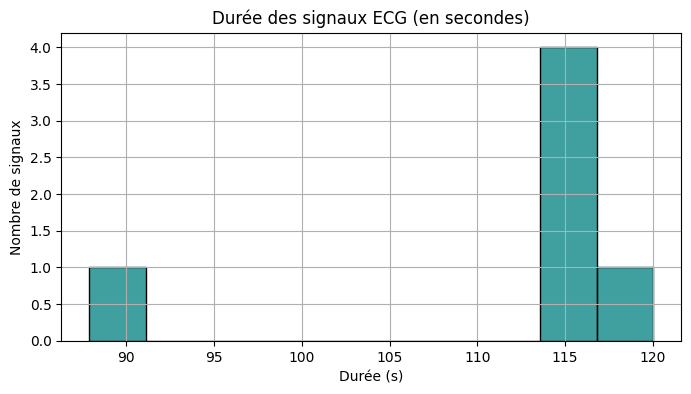

In [6]:
# Longueurs des signaux en secondes
durations_sec = [len(sig)/fs for sig in signals]

plt.figure(figsize=(8, 4))
sns.histplot(durations_sec, bins=10, color='teal')
plt.title("Durée des signaux ECG (en secondes)")
plt.xlabel("Durée (s)")
plt.ylabel("Nombre de signaux")
plt.grid(True)
plt.show()


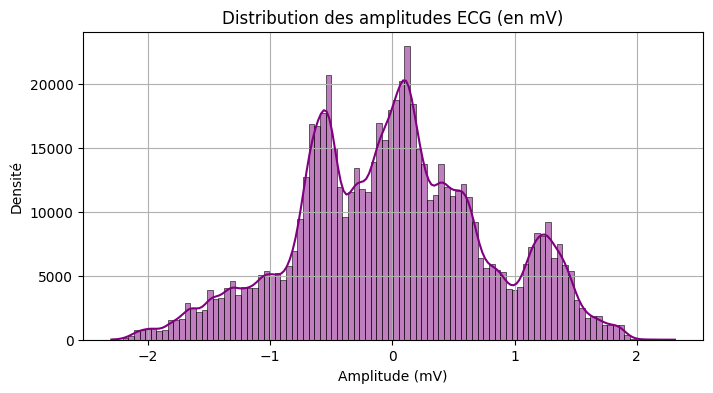

In [7]:
# Concatenation des signaux pour histogramme d'amplitude
all_values = np.concatenate(signals)

plt.figure(figsize=(8, 4))
sns.histplot(all_values, bins=100, kde=True, color='purple')
plt.title("Distribution des amplitudes ECG (en mV)")
plt.xlabel("Amplitude (mV)")
plt.ylabel("Densité")
plt.grid(True)
plt.show()


In [8]:
# Moyenne et écart-type par enregistrement
stats = pd.DataFrame({
    "label": labels,
    "mean_mV": [np.mean(sig) for sig in signals],
    "std_mV": [np.std(sig) for sig in signals],
    "durée_s": [len(sig)/fs for sig in signals]
})
display(stats)


,label,mean_mV,std_mV,durée_s
0,,-0.000076,1.111437,120.012
1,,0.000017,0.674845,115.200
2,,-0.000126,0.814353,115.200
3,,0.000225,0.406459,115.200
4,,-0.000099,0.398198,115.200
5,,-0.000214,1.033298,87.910


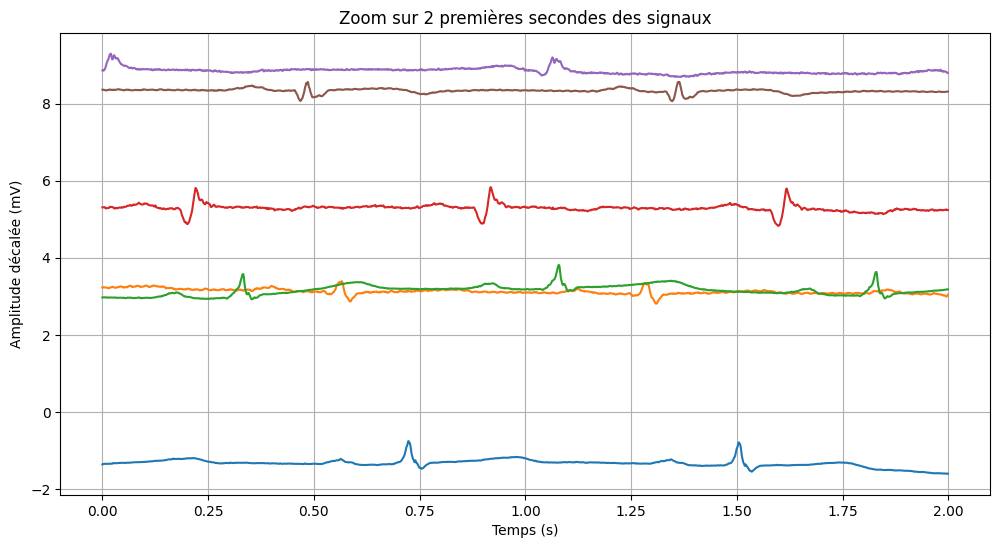

In [9]:
# Zoom sur une petite fenêtre temporelle (~2s)
plt.figure(figsize=(12, 6))
for i, sig in enumerate(signals):
    plt.plot(np.arange(0, 2*fs)/fs, sig[:2*fs] + i*2, label=f"{labels[i]}")

plt.title("Zoom sur 2 premières secondes des signaux")
plt.xlabel("Temps (s)")
plt.ylabel("Amplitude décalée (mV)")
plt.grid(True)
plt.show()


In [10]:
hea_path = r"C:\Users\user\ecg-database1.0.0\patient001\s0014lre.hea"  # adapte le chemin exact si besoin

with open(hea_path, "r", encoding="latin-1") as f:
    for i, line in enumerate(f):
        print(f"{i+1:02d}: {line.strip()}")


01: s0014lre 15 1000 115200
02: s0014lre.dat 16 2000 16 0 -948 -15706 0 i
03: s0014lre.dat 16 2000 16 0 -119 18549 0 ii
04: s0014lre.dat 16 2000 16 0 830 23394 0 iii
05: s0014lre.dat 16 2000 16 0 534 895 0 avr
06: s0014lre.dat 16 2000 16 0 -890 18834 0 avl
07: s0014lre.dat 16 2000 16 0 356 -19541 0 avf
08: s0014lre.dat 16 2000 16 0 2504 9439 0 v1
09: s0014lre.dat 16 2000 16 0 2574 8917 0 v2
10: s0014lre.dat 16 2000 16 0 -1865 11623 0 v3
11: s0014lre.dat 16 2000 16 0 -1644 -8147 0 v4
12: s0014lre.dat 16 2000 16 0 3228 -21698 0 v5
13: s0014lre.dat 16 2000 16 0 3416 -1733 0 v6
14: s0014lre.xyz 16 2000 16 0 1073 11766 0 vx
15: s0014lre.xyz 16 2000 16 0 -2277 -4898 0 vy
16: s0014lre.xyz 16 2000 16 0 1935 27959 0 vz
17: 
18: # age: 81
19: # sex: female
20: # ECG date: 17/10/1990
21: 
22: # Diagnose:
23: # Reason for admission: Myocardial infarction
24: # Acute infarction (localization): infero-latera
25: # Former infarction (localization): no
26: # Additional diagnoses: Diabetes mellitus
27:

In [11]:
def extract_diagnosis_from_hea(hea_path):
    with open(hea_path, "r", encoding='latin-1') as f:
        for line in f:
            if "Reason for admission" in line:
                print(f"Trouvé : {line.strip()}")
                return line.split(":", 1)[1].strip()
    return "Inconnu"

label = extract_diagnosis_from_hea(hea_path)
print("Label extrait :", label)


Trouvé : # Reason for admission: Myocardial infarction
Label extrait : Myocardial infarction


In [12]:
labels = []

# 🛠️ Correction ici : parcours **de tous les sous-dossiers**
for root, dirs, files in os.walk(BASE_PATH):
    for file in files:
        if file.endswith(".hea"):
            hea_path = os.path.join(root, file)
            label = extract_diagnosis_from_hea(hea_path)
            if label:
                labels.append(label)

print(f"Nombre total d’étiquettes collectées : {len(labels)}")

Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : #

In [13]:
from collections import Counter
df_labels = pd.DataFrame(Counter(labels).items(), columns=["Diagnose", "Nombre"])
df_labels = df_labels.sort_values(by="Nombre", ascending=False)

print("Nombre total d’étiquettes collectées :", len(labels))
print(df_labels)


Nombre total d’étiquettes collectées : 549
                  Diagnose  Nombre
0    Myocardial infarction     368
1          Healthy control      80
6                      n/a      27
9           Cardiomyopathy      17
12     Bundle branch block      17
3              Dysrhythmia      16
11             Hypertrophy       7
2   Valvular heart disease       6
14             Myocarditis       4
10           Stable angina       2
4   Heart failure (NYHA 2)       1
5   Heart failure (NYHA 3)       1
7   Heart failure (NYHA 4)       1
8              Palpitation       1
13         Unstable angina       1


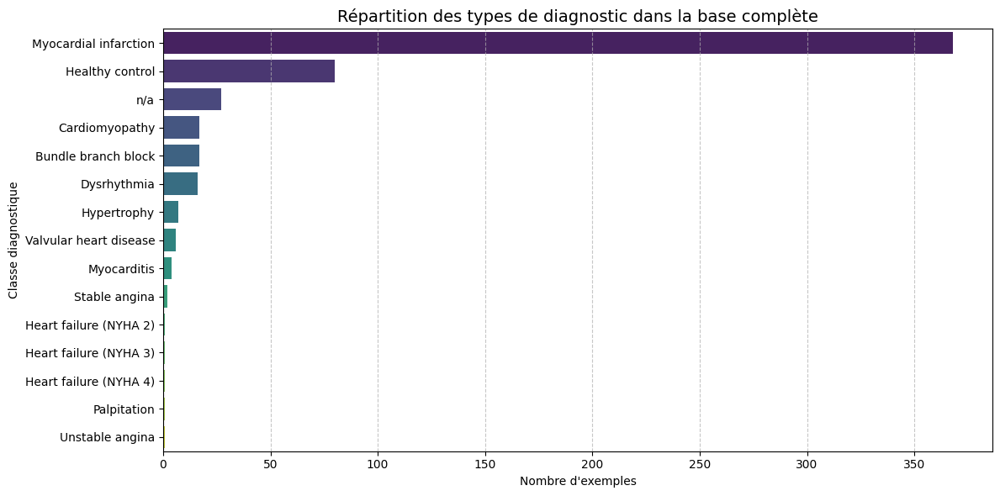

In [14]:
from collections import Counter
df_labels = pd.DataFrame(Counter(labels).items(), columns=["Diagnose", "Nombre"])
df_labels = df_labels.sort_values(by="Nombre", ascending=False)
df_labels.reset_index(drop=True, inplace=True)
df_labels.head()


plt.figure(figsize=(12, 6))
sns.barplot(data=df_labels, x="Nombre", y="Diagnose", hue="Diagnose", dodge=False, legend=False, palette="viridis")
plt.title("Répartition des types de diagnostic dans la base complète", fontsize=14)
plt.xlabel("Nombre d'exemples")
plt.ylabel("Classe diagnostique")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [15]:
# Diagnostic regroupés manuellement
regroupements = {
    "Myocardial infarction": "Myocardial infarction",
    "Cardiomyopathy": "Heart failure",
    "Heart failure (NYHA 2)": "Heart failure",
    "Heart failure (NYHA 3)": "Heart failure",
    "Heart failure (NYHA 4)": "Heart failure",
    "Bundle branch block": "Bundle branch block",
    "Dysrhythmia": "Dysrhythmia",
    "Hypertrophy": "Myocardial hypertrophy",
    "Valvular heart disease": "Valvular heart disease",
    "Myocarditis": "Myocarditis",
    "Healthy control": "Healthy control",
    "n/a": "Unknown",
    # On regroupe les autres rares dans "Miscellaneous"
    "Stable angina": "Miscellaneous",
    "Unstable angina": "Miscellaneous",
    "Palpitation": "Miscellaneous",
}

df_labels["ClassGroup"] = df_labels["Diagnose"].map(regroupements).fillna("Miscellaneous")


In [16]:
import pandas as pd
import plotly.express as px
from collections import Counter

# 🧩 La liste complète de labels (un par enregistrement)
# Exemple : labels = ['Myocardial infarction', 'Healthy control', 'Heart failure (NYHA 2)', ...]

# Étape 1 : appliquer les regroupements sur CHAQUE étiquette
labels_grouped = [regroupements.get(label, "Miscellaneous") for label in labels]

# Étape 2 : compter les occurrences
grouped_counter = Counter(labels_grouped)
df_grouped = pd.DataFrame(grouped_counter.items(), columns=["Classe regroupée", "Nombre"])
df_grouped = df_grouped.sort_values(by="Nombre", ascending=False)

# Étape 3 : afficher
fig = px.bar(
    df_grouped,
    x="Nombre",
    y="Classe regroupée",
    orientation="h",
    color="Classe regroupée",
    text="Nombre",
    title="Répartition interactive des classes après regroupement"
)

fig.update_traces(textposition="outside")
fig.update_layout(
    height=600,
    xaxis_title="Nombre d'exemples",
    yaxis_title="Classe diagnostique",
    showlegend=False
)

fig.show()


In [24]:
# Étape 1 : regroupement initial (nettoyage des labels) 
labels_grouped = [regroupements.get(lbl, "Miscellaneous") for lbl in labels]

# Étape 2 : fusionner les classes rares
fusion_mapping = {
    "Bundle branch block": "Bundle branch block",
    "Dysrhythmia": "Dysrhythmia",
    "Healthy control": "Healthy control",
    "Heart failure": "Heart failure",
    "Myocardial infarction": "Myocardial infarction",
    "Unknown": "Unknown",
    "Miscellaneous": "other",
    "Myocarditis": "other",
    "Valvular heart disease": "other",
    "Myocardial hypertrophy": "other"
}

labels_fused = [fusion_mapping[lbl] for lbl in labels_grouped]

# Étape 3 : encoder
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
y_encoded_fused = encoder.fit_transform(labels_fused)

print("Classes finales :", list(encoder.classes_))

# Vérifier distribution
import pandas as pd
print(pd.Series(y_encoded_fused).value_counts())


Classes finales : ['Bundle branch block', 'Dysrhythmia', 'Healthy control', 'Heart failure', 'Myocardial infarction', 'Unknown', 'other']
4    368
2     80
5     27
6     21
3     20
0     17
1     16
Name: count, dtype: int64


In [25]:
import pandas as pd
import plotly.express as px
from collections import Counter

# Étape 3 : compter les occurrences
fused_counter = Counter(labels_fused)
df_fused = pd.DataFrame(fused_counter.items(), columns=["Classe fusionnée", "Nombre"])
df_fused = df_fused.sort_values(by="Nombre", ascending=False)

# Étape 4 : afficher le graphique
fig = px.bar(
    df_fused,
    x="Nombre",
    y="Classe fusionnée",
    orientation="h",
    color="Classe fusionnée",
    text="Nombre",
    title="Répartition des classes après fusion"
)

fig.update_traces(textposition="outside")
fig.update_layout(
    height=600,
    xaxis_title="Nombre d'exemples",
    yaxis_title="Classe diagnostique",
    showlegend=False
)

fig.show()


Encodage des classes

In [27]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
y_encoded_fused = encoder.fit_transform(labels_fused)  # labels_fused = 7 classes
num_classes = len(encoder.classes_)
print("Classes finales :", list(encoder.classes_))


Classes finales : ['Bundle branch block', 'Dysrhythmia', 'Healthy control', 'Heart failure', 'Myocardial infarction', 'Unknown', 'other']


In [28]:
# Affichage du mapping
label_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))
print("Mapping des classes (texte -> code) avec ordre alphabétique:")
for k, v in label_mapping.items():
    print(f"{k:25} ➝ {v}")

# Vérification distribution
import pandas as pd
print("\nDistribution des classes encodées :")
print(pd.Series(y_encoded_fused).value_counts().sort_index())


Mapping des classes (texte -> code) avec ordre alphabétique:
Bundle branch block       ➝ 0
Dysrhythmia               ➝ 1
Healthy control           ➝ 2
Heart failure             ➝ 3
Myocardial infarction     ➝ 4
Unknown                   ➝ 5
other                     ➝ 6

Distribution des classes encodées :
0     17
1     16
2     80
3     20
4    368
5     27
6     21
Name: count, dtype: int64


In [29]:
# Récupère le chemin absolu du dossier parent (../)
PARENT_DIR = os.path.abspath("..")
if PARENT_DIR not in sys.path:
    sys.path.append(PARENT_DIR)

# importer les modules du dossier Analysis/
from Analysis import preprocessing

X = []
y = []

for patient_dir in sorted(os.listdir(BASE_PATH)):
    patient_path = os.path.join(BASE_PATH, patient_dir)
    if not os.path.isdir(patient_path):
        continue

    hea_files = [f for f in os.listdir(patient_path) if f.endswith(".hea")]
    for hea_file in hea_files:
        record_path = os.path.join(patient_path, hea_file.replace(".hea", ""))
        
        try:
            # Utilise le lead II (recommandé pour l’analyse)
            signal, fs, _ = preprocessing.load_ptb_record(record_path, lead="ii")

            # Raccourcir ou normaliser longueur (ex. : 10 sec à 1000 Hz → 10000)
            if len(signal) >= 10000:
                signal = signal[:10000]
            else:
                continue  # ignorer les signaux trop courts

            # Récupérer l’étiquette
            hea_path = record_path + ".hea"
            raw_label = preprocessing.extract_metadata_from_hea(hea_path).get("Diagnose", "Unknown")
            label = regroupements.get(raw_label, "Miscellaneous")

            X.append(signal)
            y.append(label)

        except Exception as e:
            print(f"Erreur pour {record_path} : {e}")

In [30]:
# Étape 1 : partir de labels_fused (après regroupement + fusion)
labels_grouped = [regroupements.get(label, "Miscellaneous") for label in labels]
labels_fused = [fusion_mapping[lbl] for lbl in labels_grouped]

# Étape 2 : extraire l’ordre réel des classes (comme affiché dans la visualisation)
ordered_classes = pd.Series(labels_fused).value_counts().sort_values(ascending=False).index.tolist()

# Étape 3 : construire le mapping texte ➝ code (avec l’ordre réel)
class_to_code = {cls: i for i, cls in enumerate(ordered_classes)}

# Étape 4 : encoder y avec ce mapping personnalisé
y_encoded_fused = np.array([class_to_code[label] for label in labels_fused])

print("🎯 Mapping (texte ➝ code) avec ordre décroissant :")
for k, v in class_to_code.items():
    print(f"{k:25} ➝ {v}")

print("\n📊 Distribution :")
print(pd.Series(y_encoded_fused).value_counts().sort_index())


🎯 Mapping (texte ➝ code) avec ordre décroissant :
Myocardial infarction     ➝ 0
Healthy control           ➝ 1
Unknown                   ➝ 2
other                     ➝ 3
Heart failure             ➝ 4
Bundle branch block       ➝ 5
Dysrhythmia               ➝ 6

📊 Distribution :
0    368
1     80
2     27
3     21
4     20
5     17
6     16
Name: count, dtype: int64


In [42]:
X = np.array(X)  # shape : (N, 10000)
y = np.array(y_encoded_fused)

print("X shape :", X.shape)
print("y shape :", y.shape)

X shape : (549, 10000)
y shape : (549,)


In [37]:
from scipy import signal
import numpy as np

# --- Filtrage passe-bande ---
def preprocess_ecg(raw_signal, fs=1000, lowcut=0.5, highcut=40, notch=50):
    nyq = 0.5 * fs
    # filtre passe-bande
    b, a = signal.butter(4, [lowcut/nyq, highcut/nyq], btype='band')
    filtered = signal.filtfilt(b, a, raw_signal)
    # notch filter pour supprimer 50 Hz
    b_notch, a_notch = signal.iirnotch(notch/(fs/2), Q=30)
    filtered = signal.filtfilt(b_notch, a_notch, filtered)
    return filtered

# --- Vérification bruit ---
def is_noisy(ecg_signal, fs=1000):
    # Ratio énergie basse fréquence / haute fréquence
    f, Pxx = signal.welch(ecg_signal, fs=fs)
    hf_energy = np.sum(Pxx[f > 50])
    lf_energy = np.sum(Pxx[(f >= 0.5) & (f <= 40)])
    snr = lf_energy / (hf_energy + 1e-8)
    return snr < 1.5  # seuil ajustable


X_clean, y_clean = [], []
window_size = 2000   
step = 1000         

# ⚠️ Utiliser y_encoded_fused (7 classes après fusion)
for xi, yi in zip(X, y_encoded_fused):
    filtered = preprocess_ecg(xi, fs=1000)
    if not is_noisy(filtered, fs=1000):
        normalized = (filtered - np.mean(filtered)) / (np.std(filtered) + 1e-8)
        
        # --- Découpage en fenêtres ---
        for start in range(0, len(normalized) - window_size + 1, step):
            segment = normalized[start:start+window_size]
            X_clean.append(segment)
            y_clean.append(yi)

X_clean = np.array(X_clean)
y_clean = np.array(y_clean)
print("X_clean shape:", X_clean.shape)  
print("y_clean shape:", y_clean.shape)

X_clean shape: (4932, 2000)
y_clean shape: (4932,)


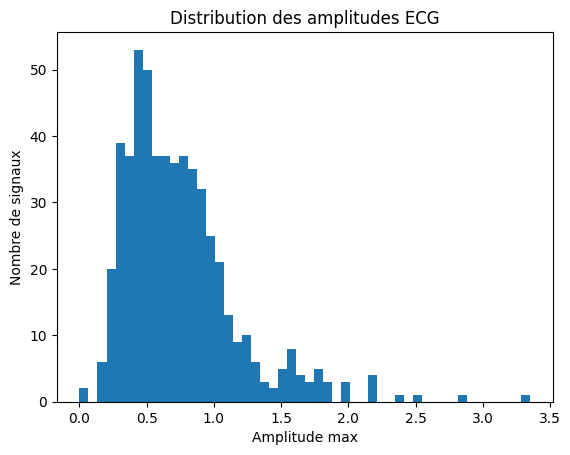

In [38]:
amps = [np.max(np.abs(sig)) for sig in X]
plt.hist(amps, bins=50)
plt.title("Distribution des amplitudes ECG")
plt.xlabel("Amplitude max")
plt.ylabel("Nombre de signaux")
plt.show()


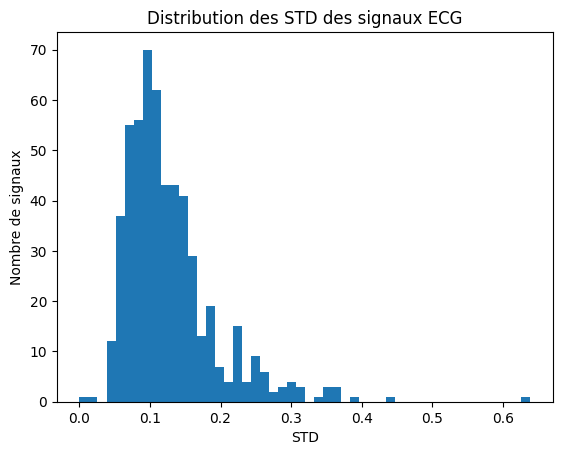

In [39]:
stds = [np.std(sig) for sig in X]
plt.hist(stds, bins=50)
plt.title("Distribution des STD des signaux ECG")
plt.xlabel("STD")
plt.ylabel("Nombre de signaux")
plt.show()


In [71]:
count_flat = 0
count_extreme = 0
count_both = 0

for xi in X:
    preprocessed = preprocess_ecg(xi, fs=1000)
    std = np.std(preprocessed)
    peak_amp = np.max(np.abs(preprocessed))

    is_flat = std < 0.01
    is_extreme = peak_amp > 5.0

    if is_flat:
        count_flat += 1
    if is_extreme:
        count_extreme += 1
    if is_flat and is_extreme:
        count_both += 1

total_rejected = count_flat + count_extreme - count_both
print("Rejetés pour STD < 0.01 :", count_flat)
print("Rejetés pour amplitude > 5 :", count_extreme)
print("Rejetés par les deux critères :", count_both)
print("Total initiaux :", len(X))
print("Signaux restants attendus :", len(X) - total_rejected)


Rejetés pour STD < 0.01 : 1
Rejetés pour amplitude > 5 : 0
Rejetés par les deux critères : 0
Total initiaux : 549
Signaux restants attendus : 548


Division + augmentation de données (sur train seulement)

In [113]:
import numpy as np
from sklearn.model_selection import train_test_split 
X_train, X_temp, y_train, y_temp = train_test_split( X_clean, y_clean, test_size=0.3, random_state=42, stratify=y_clean ) 
X_val, X_test, y_val, y_test = train_test_split( X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp ) 
print("Train:", X_train.shape, y_train.shape) 
print("Val :", X_val.shape, y_val.shape) 
print("Test :", X_test.shape, y_test.shape)

# Distribution initiale
unique, counts = np.unique(y_train, return_counts=True)
dist = dict(zip(unique, counts))
print("Distribution initiale :", dist)

X_train_aug, y_train_aug = [], []

rng = np.random.default_rng(42)

for xi, yi in zip(X_train, y_train):
    # garder l'original
    X_train_aug.append(xi)
    y_train_aug.append(yi)

    # Cas spécial : tripler classe 1 (Healthy control)
    if yi == 1:
        for _ in range(2):  # 2 copies supplémentaires → total = x3
            choice = rng.choice(["noise", "scale", "jitter"])
            if choice == "noise":
                x_new = xi + 0.01 * np.random.randn(*xi.shape)
            elif choice == "scale":
                x_new = xi * (0.9 + 0.2 * np.random.rand())
            else:  # jitter
                x_new = np.roll(xi, np.random.randint(-20, 20))
            X_train_aug.append(x_new)
            y_train_aug.append(yi)

    # Autres classes : garder ton augmentation actuelle
    elif yi in [2, 3, 4, 5, 6]:
        target_size = 1500
        current_count = dist[yi]
        if current_count < target_size:
            n_to_add = (target_size // current_count) - 1
            for _ in range(n_to_add):
                choice = rng.choice(["noise", "scale", "jitter"])
                if choice == "noise":
                    x_new = xi + 0.01 * np.random.randn(*xi.shape)
                elif choice == "scale":
                    x_new = xi * (0.9 + 0.2 * np.random.rand())
                else:
                    x_new = np.roll(xi, np.random.randint(-20, 20))
                X_train_aug.append(x_new)
                y_train_aug.append(yi)

X_train_aug = np.array(X_train_aug)
y_train_aug = np.array(y_train_aug)

# Vérif distribution finale
print("Distribution après augmentation :", np.bincount(y_train_aug))


Train: (3452, 2000) (3452,)
Val : (740, 2000) (740,)
Test : (740, 2000) (740,)
Distribution initiale : {0: 2318, 1: 504, 2: 164, 3: 132, 4: 126, 5: 107, 6: 101}
Distribution après augmentation : [2318 1512 1476 1452 1386 1498 1414]


In [114]:
# ✅ Nouveau mapping officiel après fusion
text2code = {
    "Myocardial infarction": 0,
    "Healthy control": 1,
    "Unknown": 2,
    "Heart failure": 3,
    "Bundle branch block": 4,
    "Dysrhythmia": 5,
    "Autres anomalies": 6
}

code2text = {v: k for k, v in text2code.items()}
official_order = list(text2code.keys())  # pour garder l'ordre cohérent


def proportions_from_codes(y_codes, code2text, order):
    s = pd.Series(y_codes).value_counts(normalize=True) * 100
    # remapper codes -> libellés puis réindexer sur l’ordre officiel
    s.index = s.index.map(code2text.get)
    return s.reindex(order, fill_value=0.0)


ytr = y_train
yte = y_test

train_counts = proportions_from_codes(ytr, code2text, official_order)
test_counts  = proportions_from_codes(yte, code2text, official_order)

df_train = pd.DataFrame({
    "Classe": train_counts.index,
    "Proportion (%)": train_counts.values,
    "Set": "Train"
})
df_test  = pd.DataFrame({
    "Classe": test_counts.index,
    "Proportion (%)": test_counts.values,
    "Set": "Test"
})

df_all = pd.concat([df_train, df_test], ignore_index=True)

fig = px.bar(
    df_all, x="Proportion (%)", y="Classe", color="Set",
    orientation="h", barmode="group", text="Proportion (%)",
    title="Distribution des classes dans Train et Test (%)"
)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(height=650, xaxis_title="Pourcentage (%)", yaxis_title="Classe")
fig.show()



In [115]:
# --- Reshape pour PyTorch ---
X_train_aug = X_train_aug.reshape(-1, 1, 2000)
X_val = X_val.reshape(-1, 1, 2000)
X_test = X_test.reshape(-1, 1, 2000)

print("Train:", X_train_aug.shape)
print("Val:", X_val.shape)
print("Test:", X_test.shape)


Train: (11056, 1, 2000)
Val: (740, 1, 2000)
Test: (740, 1, 2000)


In [116]:
import torch
from torch.utils.data import Dataset, DataLoader

class ECGDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Création datasets
train_dataset = ECGDataset(X_train_aug, y_train_aug)
val_dataset = ECGDataset(X_val, y_val)
test_dataset = ECGDataset(X_test, y_test)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


Construction du modéle (CNN+LSTM)

In [117]:
import torch
import torch.nn as nn

class CNN_BiLSTM_ECG(nn.Module):
    def __init__(self, num_classes=7):
        super(CNN_BiLSTM_ECG, self).__init__()
        
        # CNN avec BatchNorm
        self.cnn = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=7, stride=1, padding=3),
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.Conv1d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(2),

            nn.Conv1d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(2)
        )
        
        # Réduction de séquence
        self.global_pool = nn.AdaptiveAvgPool1d(100)
        
        # BiLSTM
        self.lstm = nn.LSTM(
            input_size=64, hidden_size=128, 
            batch_first=True, dropout=0.3, 
            bidirectional=True
        )
        
        # Fully connected
        self.fc = nn.Sequential(
            nn.Linear(128*2, 128),
            nn.ReLU(),
            nn.Dropout(0.5),   # dropout un peu plus fort
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.cnn(x)          # (B, 64, L/8)
        x = self.global_pool(x)  # (B, 64, 100)
        x = x.permute(0, 2, 1)   # (B, 100, 64)

        _, (h_n, _) = self.lstm(x)  
        h_n = h_n.permute(1, 0, 2).reshape(x.size(0), -1)  # (B, 256)

        return self.fc(h_n)


In [118]:
model = CNN_BiLSTM_ECG(num_classes=7)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

c:\Users\user\anaconda3\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1



In [119]:
# Vérification du DataLoader
for batch_idx, (inputs, labels) in enumerate(train_loader):
    print(f"Batch {batch_idx+1}")
    print(" - inputs shape :", inputs.shape)  # devrait être (batch_size, 3000)
    print(" - labels shape :", labels.shape)  # devrait être (batch_size,)
    break  # on s'arrête après le 1er batch


Batch 1
 - inputs shape : torch.Size([64, 1, 2000])
 - labels shape : torch.Size([64])


Epoch 01 | Train Loss: 1.8306 | Train Acc: 0.251 | BalAcc: 0.223 | F1: 0.202 || Val Loss: 1.4078 | Val Acc: 0.547 | BalAcc: 0.261 | F1: 0.240
Epoch 02 | Train Loss: 1.6318 | Train Acc: 0.352 | BalAcc: 0.334 | F1: 0.313 || Val Loss: 1.4251 | Val Acc: 0.489 | BalAcc: 0.281 | F1: 0.240
Epoch 03 | Train Loss: 1.3761 | Train Acc: 0.463 | BalAcc: 0.449 | F1: 0.437 || Val Loss: 1.2319 | Val Acc: 0.576 | BalAcc: 0.309 | F1: 0.283
Epoch 04 | Train Loss: 1.0839 | Train Acc: 0.594 | BalAcc: 0.589 | F1: 0.583 || Val Loss: 1.0748 | Val Acc: 0.612 | BalAcc: 0.435 | F1: 0.383
Epoch 05 | Train Loss: 0.7672 | Train Acc: 0.725 | BalAcc: 0.729 | F1: 0.726 || Val Loss: 1.0425 | Val Acc: 0.647 | BalAcc: 0.480 | F1: 0.426
Epoch 06 | Train Loss: 0.5713 | Train Acc: 0.798 | BalAcc: 0.807 | F1: 0.804 || Val Loss: 0.9642 | Val Acc: 0.686 | BalAcc: 0.448 | F1: 0.444
Epoch 07 | Train Loss: 0.3853 | Train Acc: 0.867 | BalAcc: 0.876 | F1: 0.874 || Val Loss: 1.0841 | Val Acc: 0.661 | BalAcc: 0.561 | F1: 0.486
Epoch 

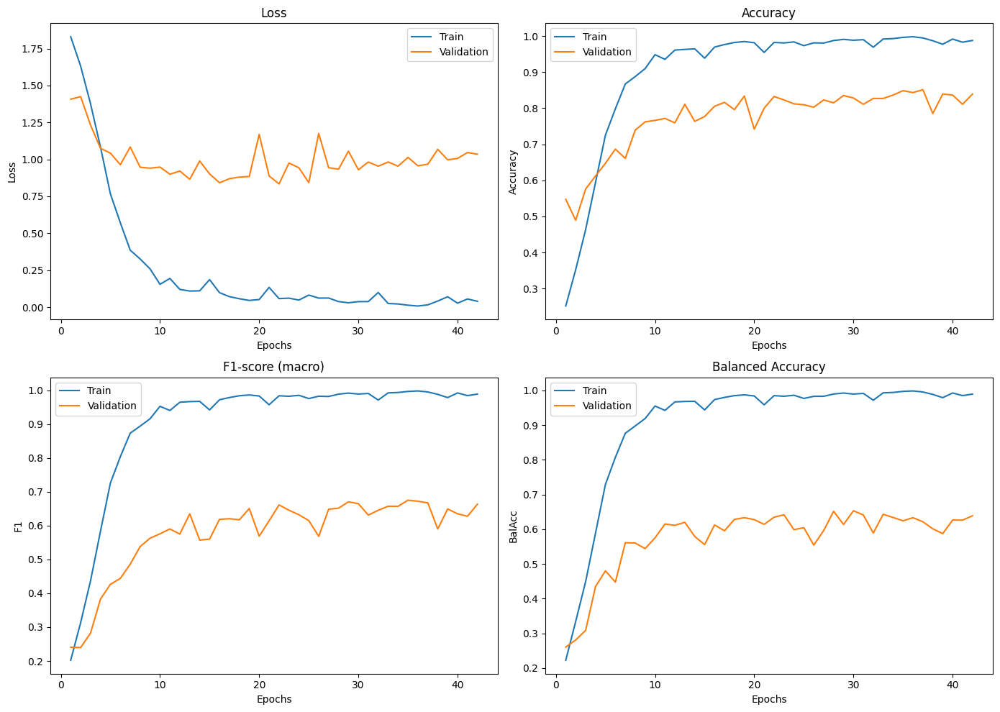

In [120]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from sklearn.metrics import balanced_accuracy_score, f1_score
import matplotlib.pyplot as plt

# --- Réinitialiser le modèle ---
model = CNN_BiLSTM_ECG(num_classes=len(np.unique(y_clean))).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

best_val_loss = float("inf")
patience, wait = 20, 0

history = {"train_loss": [], "val_loss": [],
           "train_acc": [], "val_acc": [],
           "train_f1": [], "val_f1": [],
           "train_balacc": [], "val_balacc": []}

for epoch in range(100):
    # --- Train ---
    model.train()
    train_loss, y_true_train, y_pred_train = 0, [], []
    
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        preds = outputs.argmax(1)
        y_true_train.extend(y_batch.cpu().numpy())
        y_pred_train.extend(preds.cpu().numpy())
    
    train_acc = (np.array(y_true_train) == np.array(y_pred_train)).mean()
    train_bal_acc = balanced_accuracy_score(y_true_train, y_pred_train)
    train_f1 = f1_score(y_true_train, y_pred_train, average="macro")

    # --- Validation ---
    model.eval()
    val_loss, y_true_val, y_pred_val = 0, [], []
    
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            val_loss += loss.item()
            preds = outputs.argmax(1)
            y_true_val.extend(y_batch.cpu().numpy())
            y_pred_val.extend(preds.cpu().numpy())
    
    val_acc = (np.array(y_true_val) == np.array(y_pred_val)).mean()
    val_bal_acc = balanced_accuracy_score(y_true_val, y_pred_val)
    val_f1 = f1_score(y_true_val, y_pred_val, average="macro")

    # --- Sauvegarde dans history ---
    history["train_loss"].append(train_loss/len(train_loader))
    history["val_loss"].append(val_loss/len(val_loader))
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)
    history["train_f1"].append(train_f1)
    history["val_f1"].append(val_f1)
    history["train_balacc"].append(train_bal_acc)
    history["val_balacc"].append(val_bal_acc)

    # --- Logs ---
    print(f"Epoch {epoch+1:02d} | "
          f"Train Loss: {history['train_loss'][-1]:.4f} | "
          f"Train Acc: {train_acc:.3f} | BalAcc: {train_bal_acc:.3f} | F1: {train_f1:.3f} || "
          f"Val Loss: {history['val_loss'][-1]:.4f} | "
          f"Val Acc: {val_acc:.3f} | BalAcc: {val_bal_acc:.3f} | F1: {val_f1:.3f}")
    
    # --- Early stopping ---
    if val_loss < best_val_loss - 0.001:
        best_val_loss = val_loss
        wait = 0
        torch.save(model.state_dict(), "best_model_targeted.pth")
    else:
        wait += 1
        if wait >= patience:
            print("⏹️ Early stopping déclenché")
            break
# ------------------------
# 📊 Tracés des courbes
# ------------------------
epochs = range(1, len(history["train_loss"])+1)

plt.figure(figsize=(14,10))

plt.subplot(2,2,1)
plt.plot(epochs, history["train_loss"], label="Train")
plt.plot(epochs, history["val_loss"], label="Validation")
plt.title("Loss"); plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend()

plt.subplot(2,2,2)
plt.plot(epochs, history["train_acc"], label="Train")
plt.plot(epochs, history["val_acc"], label="Validation")
plt.title("Accuracy"); plt.xlabel("Epochs"); plt.ylabel("Accuracy"); plt.legend()

plt.subplot(2,2,3)
plt.plot(epochs, history["train_f1"], label="Train")
plt.plot(epochs, history["val_f1"], label="Validation")
plt.title("F1-score (macro)"); plt.xlabel("Epochs"); plt.ylabel("F1"); plt.legend()

plt.subplot(2,2,4)
plt.plot(epochs, history["train_balacc"], label="Train")
plt.plot(epochs, history["val_balacc"], label="Validation")
plt.title("Balanced Accuracy"); plt.xlabel("Epochs"); plt.ylabel("BalAcc"); plt.legend()

plt.tight_layout()
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_32328\3444166492.py:6: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



              precision    recall  f1-score   support

           0      0.907     0.907     0.907       497
           1      0.778     0.843     0.809       108
           2      0.697     0.657     0.676        35
           3      0.600     0.517     0.556        29
           4      0.640     0.593     0.615        27
           5      0.682     0.652     0.667        23
           6      0.667     0.667     0.667        21

    accuracy                          0.845       740
   macro avg      0.710     0.691     0.700       740
weighted avg      0.843     0.845     0.843       740



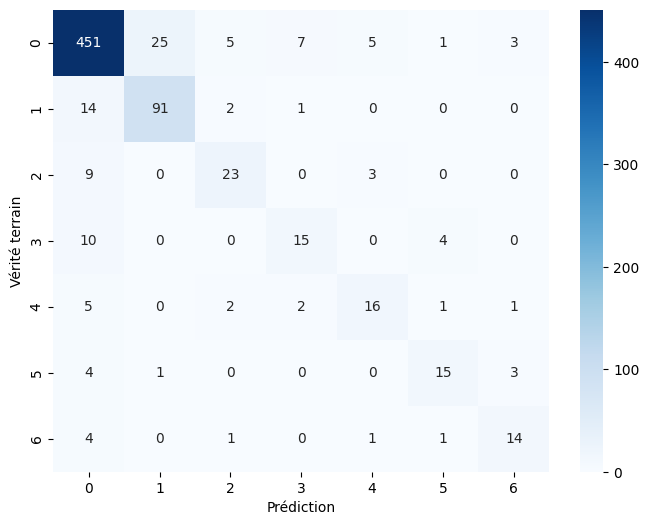

In [121]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Charger meilleur modèle
model.load_state_dict(torch.load("best_model_targeted.pth"))
model.eval()

y_true, y_pred = [], []
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch = X_batch.to(device)
        outputs = model(X_batch)
        preds = outputs.argmax(1).cpu().numpy()
        y_pred.extend(preds)
        y_true.extend(y_batch.numpy())

print(classification_report(y_true, y_pred, digits=3))

# Matrice de confusion
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Prédiction")
plt.ylabel("Vérité terrain")
plt.show()

In [ ]:
# Sauvegarde du modèle
torch.save(model.state_dict(), "best_model_targeted.pth")
print("✅ Modèle sauvegardé sous best_model_targeted.pth")

✅ Modèle sauvegardé sous best_model_targeted.pth
